The aim of this notebook is to test the LM distance minimization procedure on real image.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
import pandas as pd
import pathlib
from scipy.optimize import nnls

from tyssue.generation import generate_ring
from tyssue.draw.plt_draw import quick_edge_draw
from tyssue.solvers.sheet_vertex_solver import Solver
from tyssue.config.draw import sheet_spec
from tyssue.draw.plt_draw import sheet_view
from tyssue.io.hdf5 import save_datasets

from tyssue_taylor.adjusters.adjust_annular import set_init_point, prepare_tensions, adjust_tensions
from tyssue_taylor.models.annular import AnnularGeometry as geom
from tyssue_taylor.models.annular import model
from tyssue_taylor.adjusters.cost_functions import _distance
from tyssue_taylor.segmentation.segment2D import generate_ring_from_image, normalize_scale
from tyssue_taylor.adjusters.force_inference import infer_forces, _coef_matrix, _right_side
from tyssue_taylor.models.display import (create_organo, print_tensions, rendering_results,
                                          rendering_convergence_results,
                                          plot_force_inference)
from tyssue_taylor.adjusters.adjust_annular import (prepare_tensions, adjust_tensions,
                                                    adjust_areas, adjust_scale, adjust_parameters)

Error: IPOPT shared library failed to import


Using TensorFlow backend.


## Segmentation


In [2]:
brigthfield_path = '../../../assets/sample_image_actin_surligned.tif'
#dapi_path = '../assets/CELLPROFILER_sample_image_dapi.tiff.csv'
dapi_path = '../../../assets/sample_image_dapi.tiff'
scp_path = '../../../assets/star_convex_polynoms/models'
#initialising the mesh
organo, inners, outers, centers = generate_ring_from_image(brigthfield_path, dapi_path,
                                                           threshold=2,
                                                           method='SCP',
                                                           scp_model_path=scp_path,
                                                           rol_window_inside=20,
                                                           rol_window_outside=5)
Nf = organo.Nf
geom.update_all(organo)
#alpha as proposed in the doc (in french) https://www.sharelatex.com/read/zdxptpnrryhc
alpha = 1 + np.sin(np.pi/Nf)/(np.mean(organo.face_df.area)*organo.settings['R_in']*np.sin(2*np.pi/Nf)-2*np.mean(organo.face_df.area)*
                             np.sin(2*np.pi/Nf)*(8-2*(np.sin(2*np.pi/Nf)**2-4)/(np.sin(np.pi/Nf)**4+8*np.sin(np.pi/Nf)**2)
                                                )*(organo.settings['R_in']+organo.settings['R_out']))
print(alpha)
alpha = 1.001
# Model parameters or specifications
specs = {
    'face':{
        'is_alive': 1,
        'prefered_area':  list(alpha*organo.face_df.area.values), 
        'area_elasticity': 1.,},
    'edge':{        
        'ux': 0.,
        'uy': 0.,
        'uz': 0.,
        'line_tension': 0.1,
        'is_active': 1
        },
    'vert':{
        'adhesion_strength': 0.,
        'x_ecm': 0.,
        'y_ecm': 0.,
        'is_active': 1
        },
    'settings': {
        'lumen_elasticity': 0.1,
        'lumen_prefered_vol': organo.settings['lumen_volume'],
        'lumen_volume': organo.settings['lumen_volume']
        }
    }

organo.update_specs(specs, reset=True)
geom.update_all(organo)
normalize_scale(organo, geom)
geom.update_all(organo)
inners = inners[:int(2830/2)]
outers = outers[:int(outers.shape[0]/2)]

organo.vert_df[['x_ecm', 'y_ecm']] = organo.vert_df[['x', 'y']]

organo.vert_df.loc[organo.basal_verts, 'adhesion_strength'] = 0.01


Loading network weights from 'weights_best.h5'.


Reseting datasets values with new specs


{'geometry': 'planar', 'R_in': 119.94799383544922, 'R_out': 134.21666275024415, 'R_vit': None}
0.9999999950313019


Creating a printing function

In [3]:
def print_tensions(exp_organo, th_organo):
    draw_specs = sheet_spec()
    tension_max = np.max(exp_organo.edge_df.line_tension.values.copy())
    edge_color = 1/tension_max*exp_organo.edge_df.line_tension.values.copy()
    cmap = plt.cm.get_cmap('viridis')
    edge_cmap = cmap(edge_color)
    draw_specs['vert']['visible'] = False
    draw_specs['edge']['color'] = edge_cmap
    draw_specs['edge']['width'] = 0.25+3*edge_color
    fig, ax = quick_edge_draw(th_organo, lw=5, c='k', alpha=0.2)
    fig, ax = sheet_view(exp_organo, ax=ax, **draw_specs)
    fig.set_size_inches(12, 12)
    plt.xlabel('Size in µm')
    plt.ylabel('Size in µm')

Define the optimization parameters

In [4]:
energy_opt = {'options': {'gtol': 1e-5, 'ftol': 1e-5}}


bfgs_opt = {'method': 'bfgs','options': {'gtol':1e-1,'ftol': 1e-5}}
trf_opt = {'bounds': ([-1e-8]*(3*organo.Nf),[1000]*(3*organo.Nf)), 
           'method': 'trf','xtol':1e-8,'ftol': 1e-5, 'verbose': 2}
lm_opt = {'method': 'lm','xtol':1e-7,'ftol': 1e-6, 'verbose': 1}
psqp_opt = {'lb': 0, 'ub': 1e6, 'method': 'dist_PSQP', 'output_path': './PSQP_min_dist'}

reg_weight = 1e-3
theta = 0.02

## Force inference

In [5]:
def get_sim_mat(Nf, Ra, Rb, sum_lbda=0.1):

    sin_t = np.sin(np.pi/Nf)
    sin_2t = np.sin(2*np.pi/Nf)

    A = 0.5 * (Rb**2 - Ra**2) * sin_2t
    dAdRa = - sin_2t * Ra
    dAdRb = sin_2t * Rb
    dladRa = dlbdRb = 2*sin_t

    # variables are
    # (A - A_0), \Lambda_a, \Lambda_h
    problem_mat = np.array(
        [
            [dAdRa, dladRa, -1],
            [dAdRb, 0,       1],
            [0,     1,       1]
        ])

    b = np.array([0, 0, sum_lbda])
    return problem_mat, b

In [10]:
res_list = []

/home/felix/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:15: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  from ipykernel import kernelapp as app



Distance from th org to exp org:  13.916587511877985

Distance from th org to exp org:  26.28293426983578

Distance from th org to exp org:  68.52197833151098

Distance from th org to exp org:  85.21210956655965

Distance from th org to exp org:  103.61382420403098

Distance from th org to exp org:  125.0661715995513

Distance from th org to exp org:  146.85769330361182

Distance from th org to exp org:  170.2103335851639

Distance from th org to exp org:  187.70034036177063

Distance from th org to exp org:  201.83268775160045

Distance from th org to exp org:  218.69351381249237

Distance from th org to exp org:  225.28707482302568

Distance from th org to exp org:  242.9028326738603

Distance from th org to exp org:  243.90127860703467

Distance from th org to exp org:  250.2522149594089

Distance from th org to exp org:  254.7509791105639

Distance from th org to exp org:  267.0725002014827

Distance from th org to exp org:  276.1482956615309

Distance from th org to exp org:  278

/home/felix/anaconda3/lib/python3.6/site-packages/matplotlib/pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)



Distance from th org to exp org:  273.90820430753837

Distance from th org to exp org:  279.13012437853195

Distance from th org to exp org:  282.35321003459455

Distance from th org to exp org:  287.314707456467

Distance from th org to exp org:  290.43455873942287

Distance from th org to exp org:  297.48968413638437

Distance from th org to exp org:  295.25799868209833

Distance from th org to exp org:  296.35831519319527

Distance from th org to exp org:  295.4779098850334

Distance from th org to exp org:  294.2244621115233

Distance from th org to exp org:  298.1640288961226

Distance from th org to exp org:  298.11402013526117

Distance from th org to exp org:  303.6096701316857

Distance from th org to exp org:  307.0475523800184

Distance from th org to exp org:  309.0230315769842

Distance from th org to exp org:  314.5531478383838

Distance from th org to exp org:  312.29976776516946

Distance from th org to exp org:  314.981600655095

Distance from th org to exp org:  317.

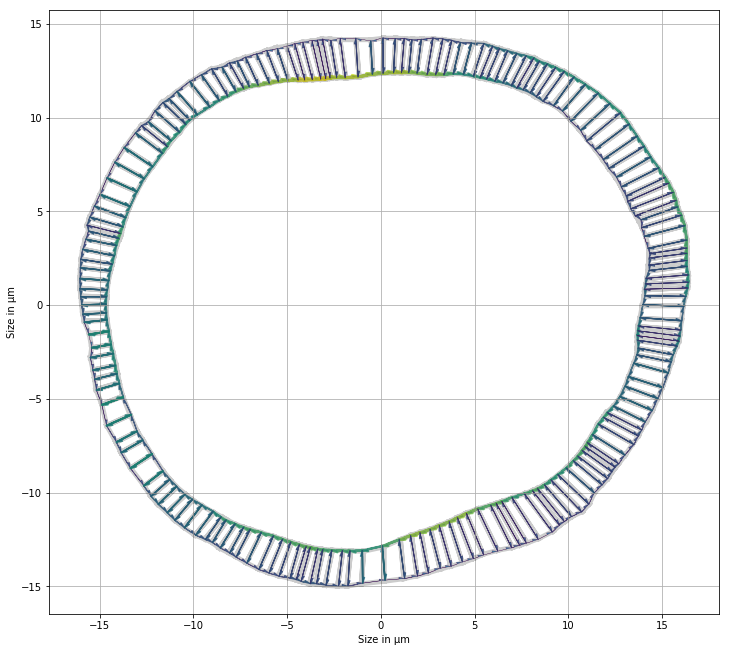

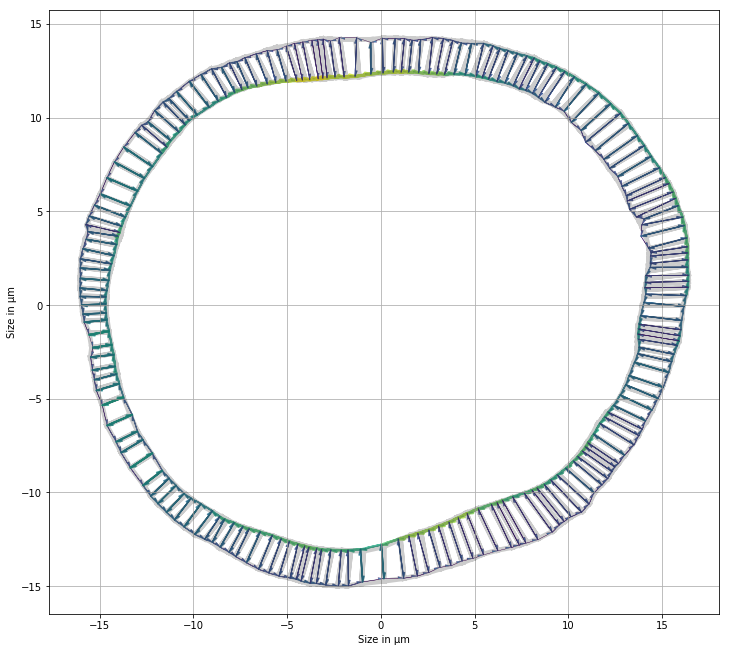

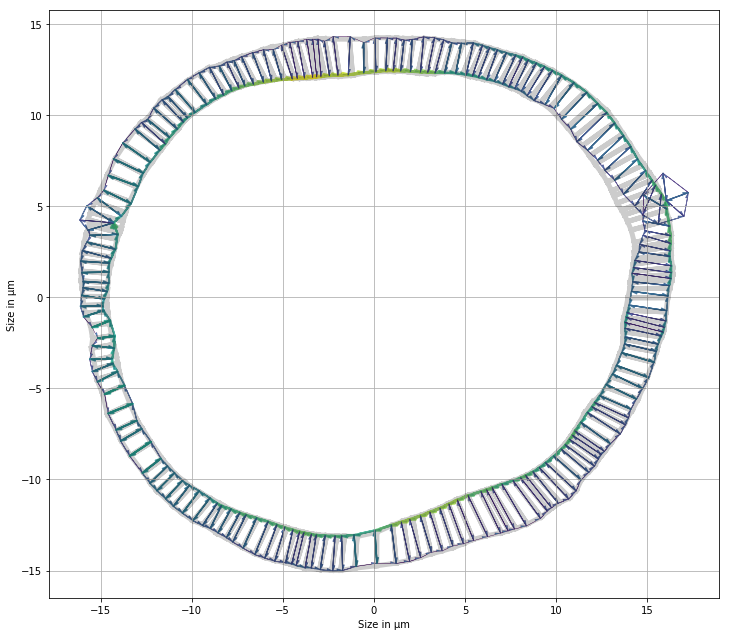

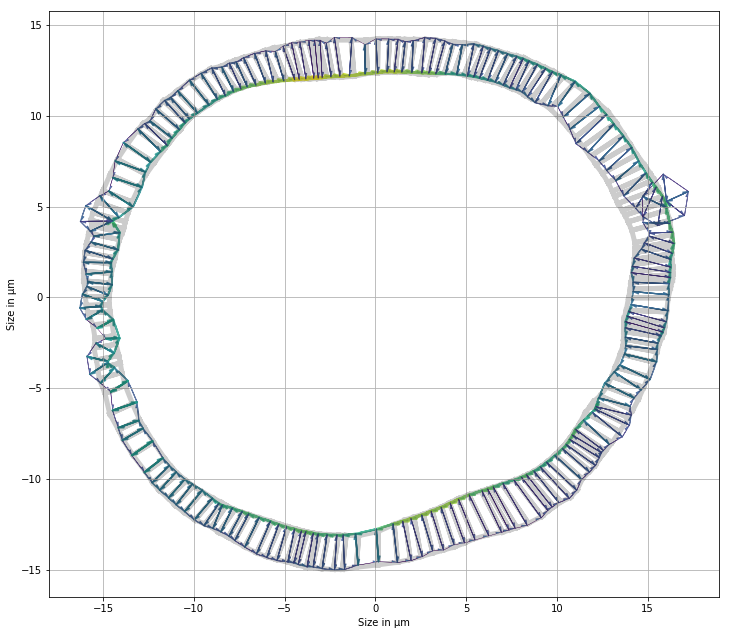

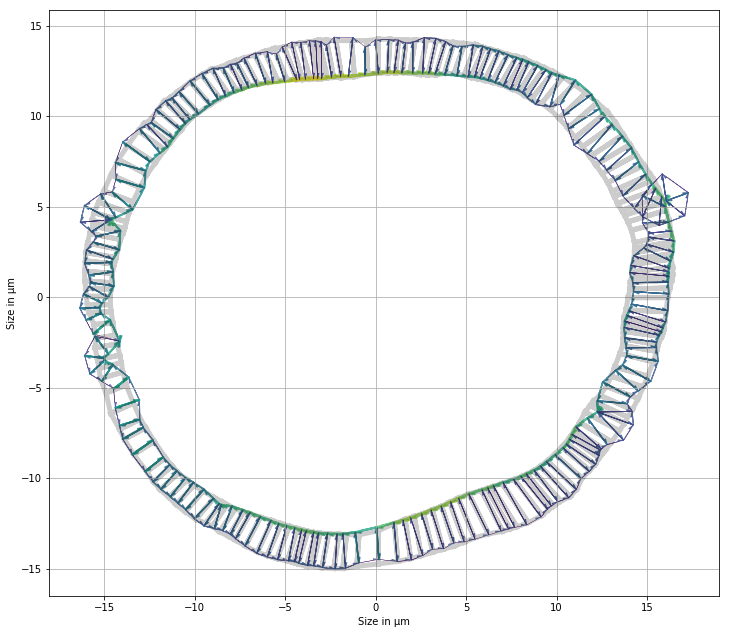

...

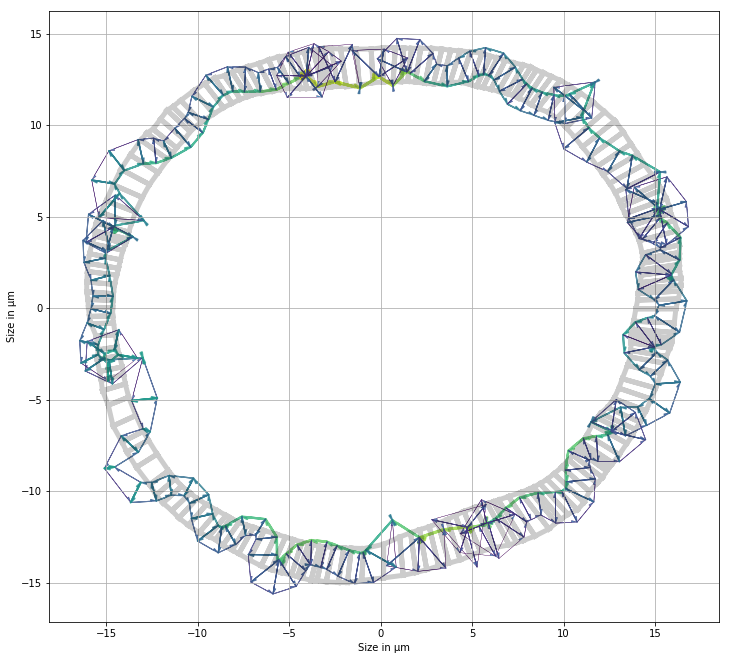

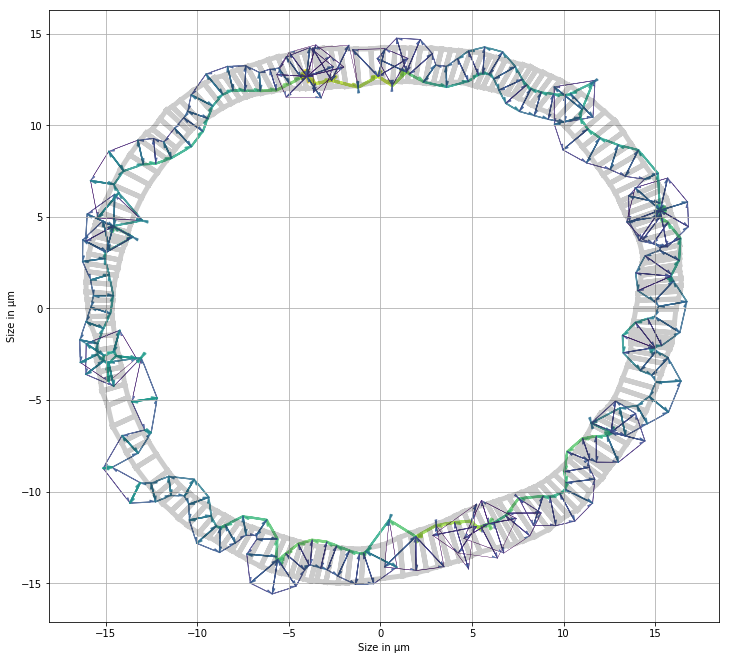

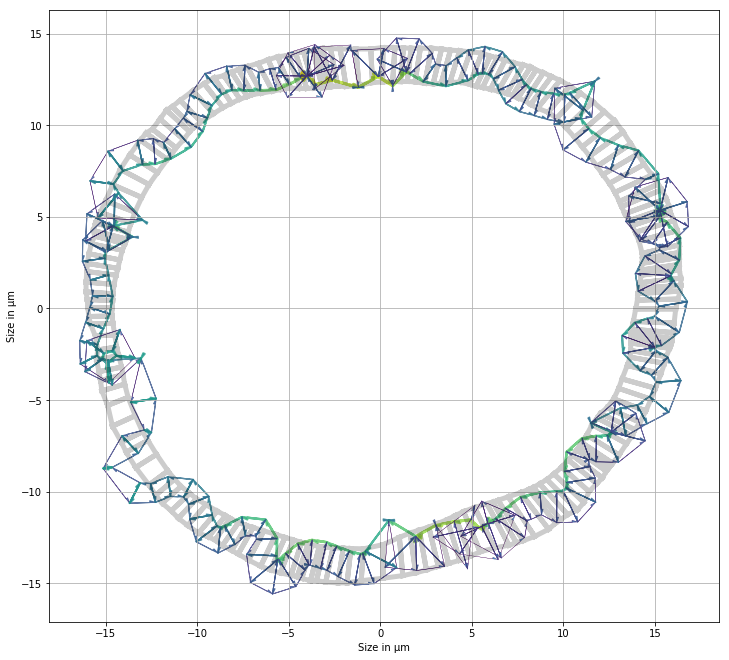

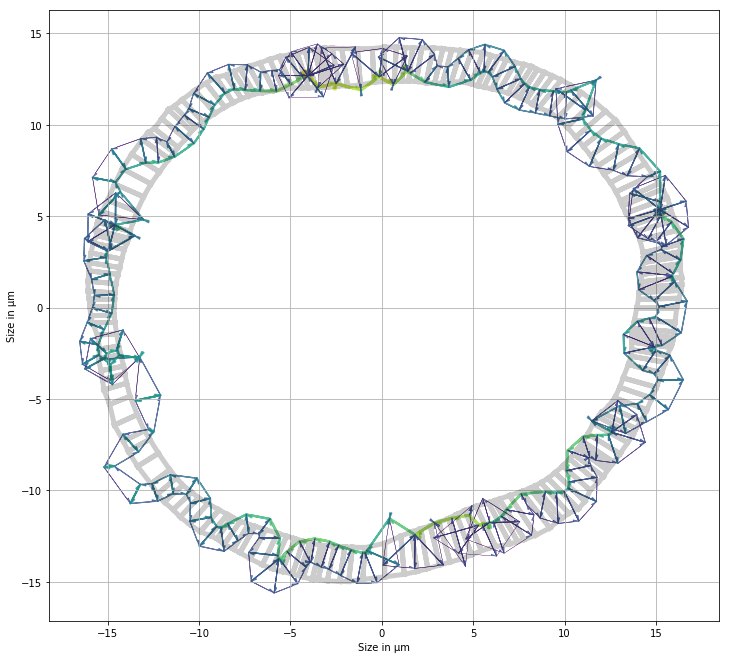

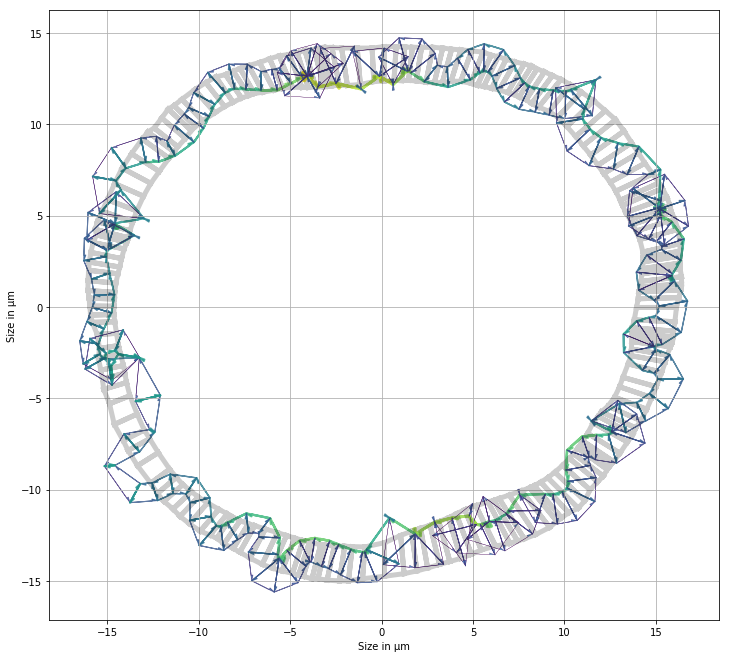

In [11]:
for i in np.linspace(0.01, 0.5, 100):
    matrix = _coef_matrix(organo, sup_param='areas')
    constant = _right_side(organo, matrix)
    params_in_sym_mesh = np.linalg.solve(*get_sim_mat(organo.Nf,
                                                      organo.settings['R_in'],
                                                      organo.settings['R_out'],
                                                      sum_lbda = i))
    organo.get_extra_indices()
    non_lateral_edges = np.concatenate((organo.apical_edges,
                                        organo.basal_edges))
    sym_height = (organo.settings['R_out']-organo.settings['R_in'])*np.cos(np.pi/organo.Nf)
    polar_coefs = np.ones(organo.Nf)
    for cell in range(organo.Nf):
        api_vertex = organo.edge_df.loc[organo.apical_edges,
                                        ('srce', 'trgt')][organo.edge_df.face == cell]
        coord_api_vertex = organo.vert_df.loc[np.squeeze(api_vertex.values),
                                              ('x', 'y')].values
        coord_cell_center = np.squeeze(organo.face_df.loc[[cell], ('x', 'y')].values)
        #((C(1,1)-A(1,1))*(B(1,1)-A(1,1)))+((C(1,2)-A(1,2))*(B(1,2)-A(1,2)))
        pos_param = np.dot(coord_cell_center - coord_api_vertex[0],
                           coord_cell_center - coord_api_vertex[1])
        comp = np.array((coord_api_vertex[1, 0] - coord_api_vertex[0, 0],
                         coord_api_vertex[1, 1] - coord_api_vertex[0, 1]))
        proj = coord_api_vertex[0] + pos_param * comp
        #api_vert = organo.vert_df.loc[organo.apical_verts[[cell, (cell+1)%organo.Nf]],
        #                              ('x', 'y')].values
        polar_coefs[cell] = np.linalg.norm(proj - coord_cell_center)
    matrix = _coef_matrix(organo, sup_param='areas')
    constant = _right_side(organo, matrix)
    matrix = matrix[:-1]
    constant = constant[:-1]
    avg_cste = [4*((params_in_sym_mesh[1:].sum()+params_in_sym_mesh[-1])/3 /
                   (organo.face_df.area.mean() + params_in_sym_mesh[0])**1.5)]*organo.Nf
    for i in range(organo.Nf):
        i_cell_line = np.zeros(4*organo.Nf+1)
        index = np.squeeze(np.argwhere(organo.edge_df.face.values == i))
        index_suiv = np.squeeze(np.argwhere(organo.edge_df.face.values == (i+1)%organo.Nf))
        index[-1] = index_suiv[-2]
        #index[-1] = 40
        #print(index)
        i_cell_line[index] = [polar_coefs[i], 1, 1, 1]
        #print(i_cell_line)
        matrix = np.vstack((matrix, i_cell_line))
    constant = np.concatenate((constant, avg_cste))
    mat_eq_cst, residuals = nnls(matrix, constant)
    organo_eq_cst = organo.copy()
    organo_eq_cst.edge_df.loc[:, 'line_tension'] = prepare_tensions(organo_eq_cst,
                                                                     mat_eq_cst[:3*organo.Nf])
    organo_eq_cst.face_df.loc[:, 'prefered_area'] = organo_eq_cst.face_df.area + mat_eq_cst[3*organo.Nf:
                                                                                              4*organo.Nf]
    organo_eq_cst.settings['lumen_prefered_vol'] = organo_eq_cst.settings['lumen_volume'] + mat_eq_cst[-1]
    Solver.find_energy_min(organo_eq_cst, geom, model)
    print_tensions(organo_eq_cst, organo)
    print('\nDistance from th org to exp org: ', np.sum(np.linalg.norm(_distance(organo_eq_cst, organo), axis=1)))
    res_list.append(np.sum(np.linalg.norm(_distance(organo_eq_cst, organo), axis=1)))

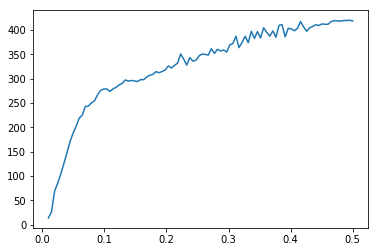

In [13]:
from matplotlib import pyplot as plt
plt.plot(np.linspace(0.01, 0.5, 100), res_list)